## Frame Extraction 

In [5]:
import cv2
import os

video_path = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Project_videos\Alligator_tracking\IMG_6025.MOV"
output_folder = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Frames"

os.makedirs(output_folder, exist_ok=True)

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error opening video file")
    exit()

frame_index = 0
saved_count = 0

while True:
    ret, frame = cap.read()
    
    if not ret:
        break

    #frame = cv2.rotate(frame, cv2.ROTATE_90_CLOCKWISE)
    # Save every 10th frame
    if frame_index % 10 == 0:
        filename = os.path.join(output_folder, f"frame_{saved_count:05d}.jpg")
        cv2.imwrite(filename, frame)
        saved_count += 1
    
    frame_index += 1

cap.release()

print(f"Done! Saved {saved_count} frames.")

Done! Saved 92 frames.


## Enhancement 

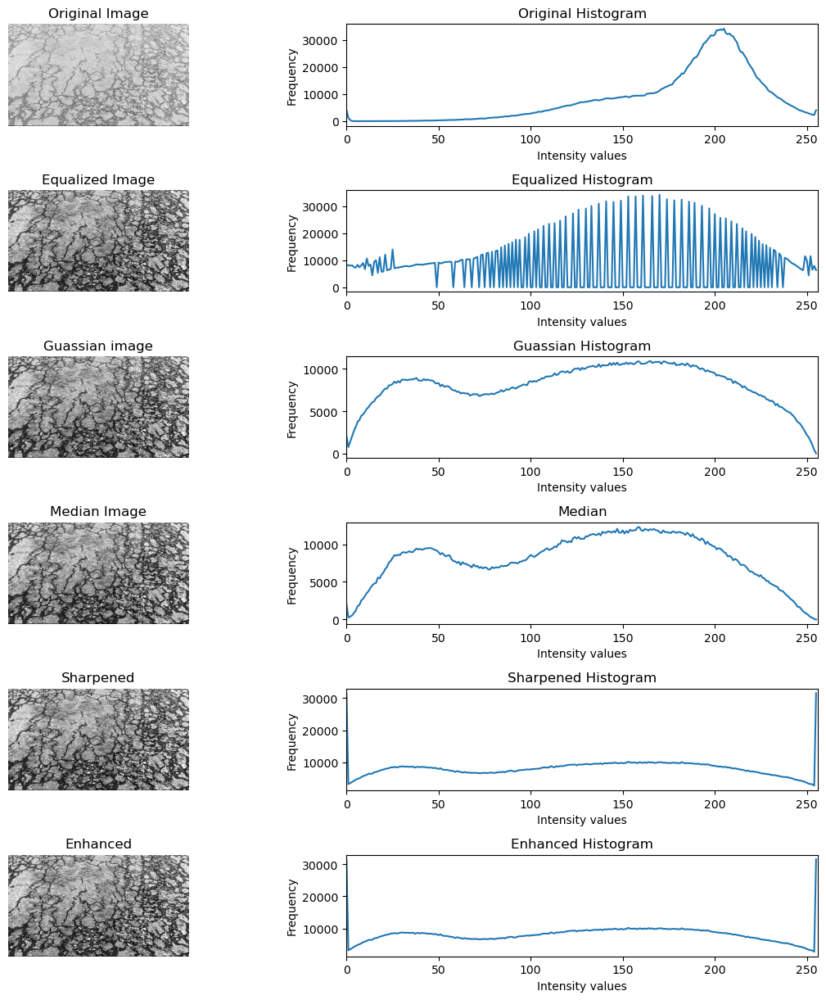

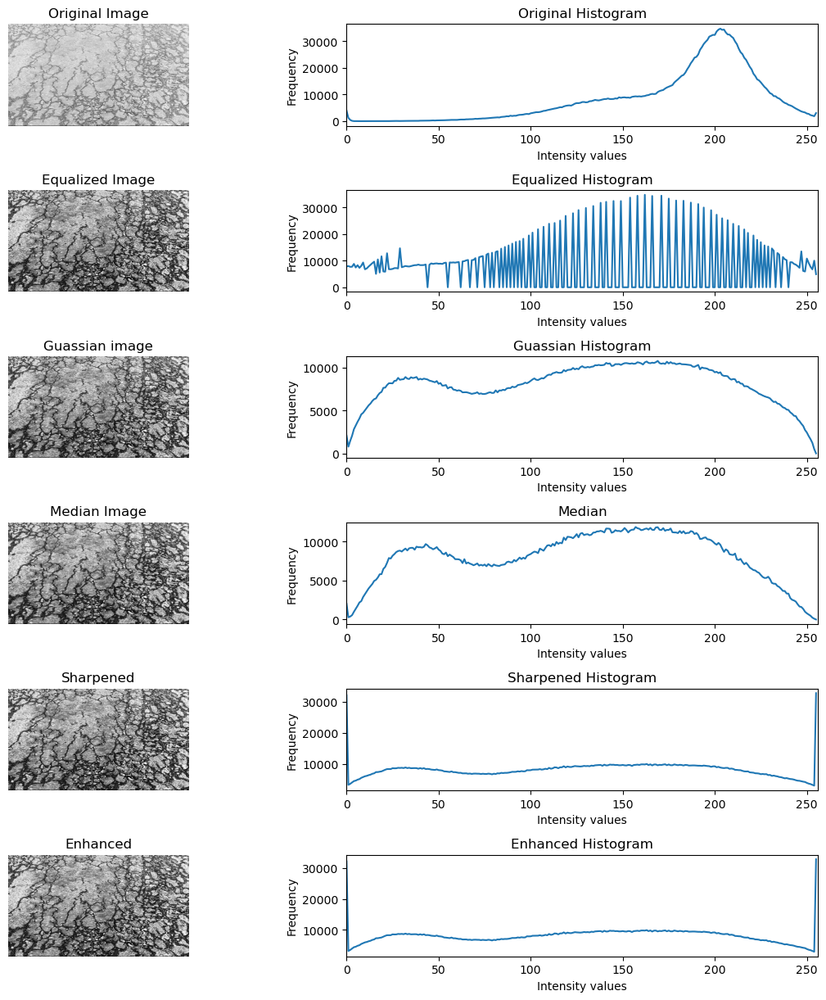

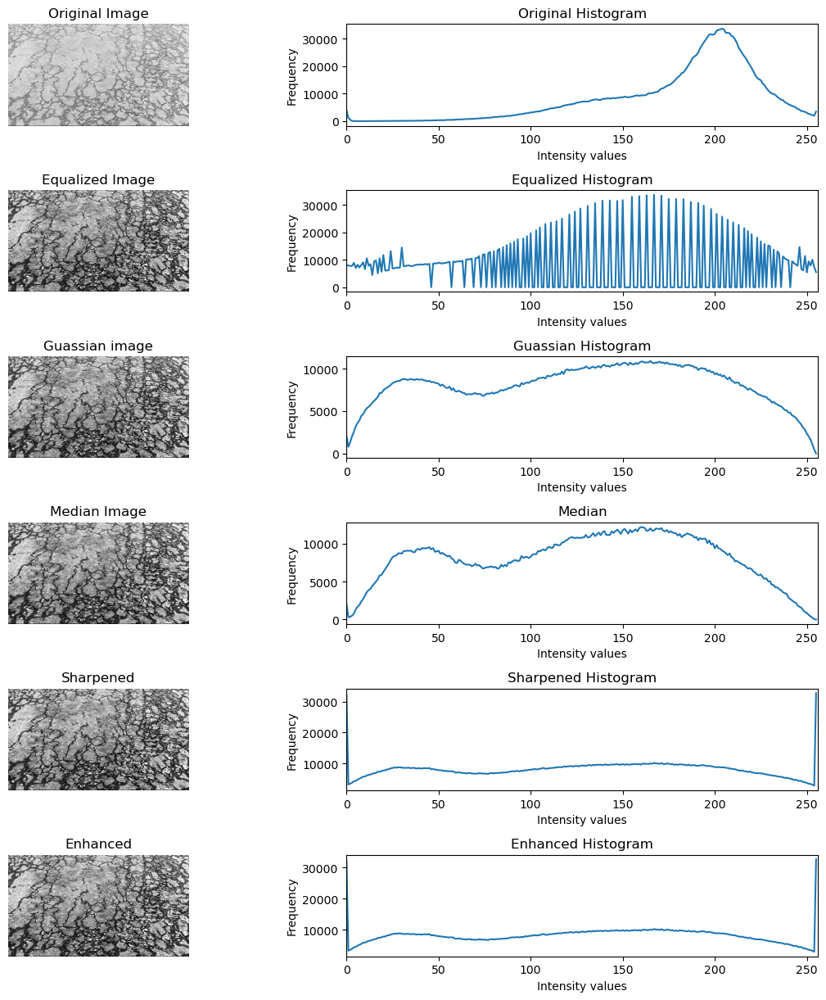

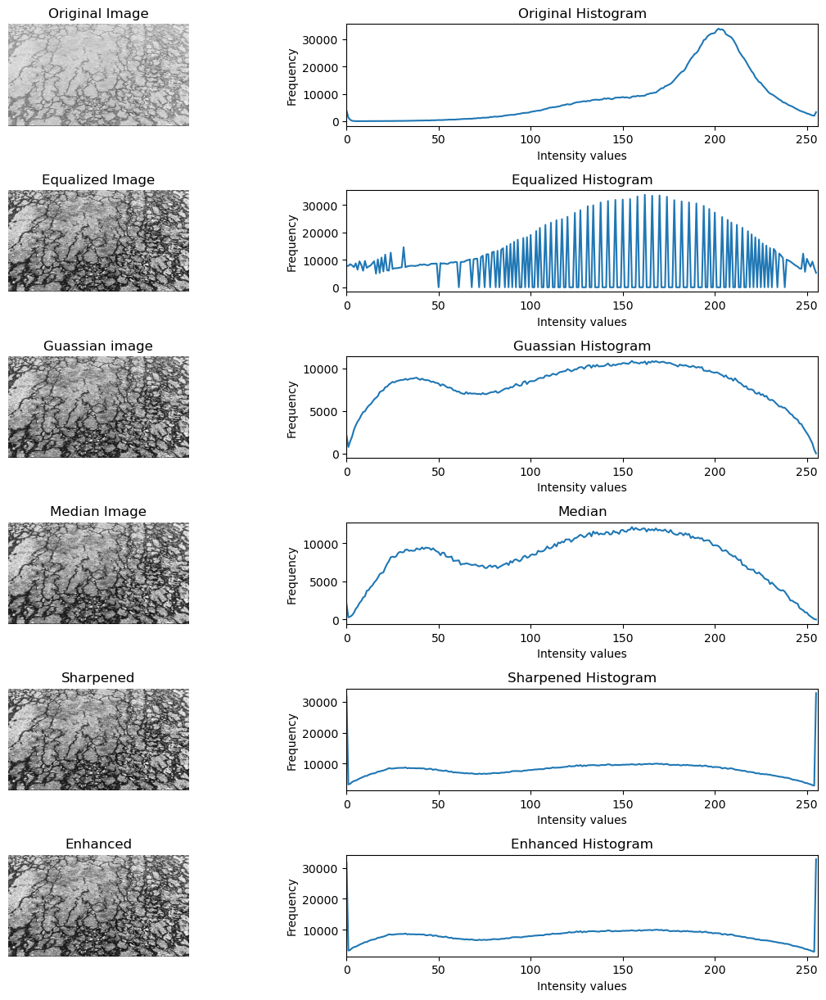

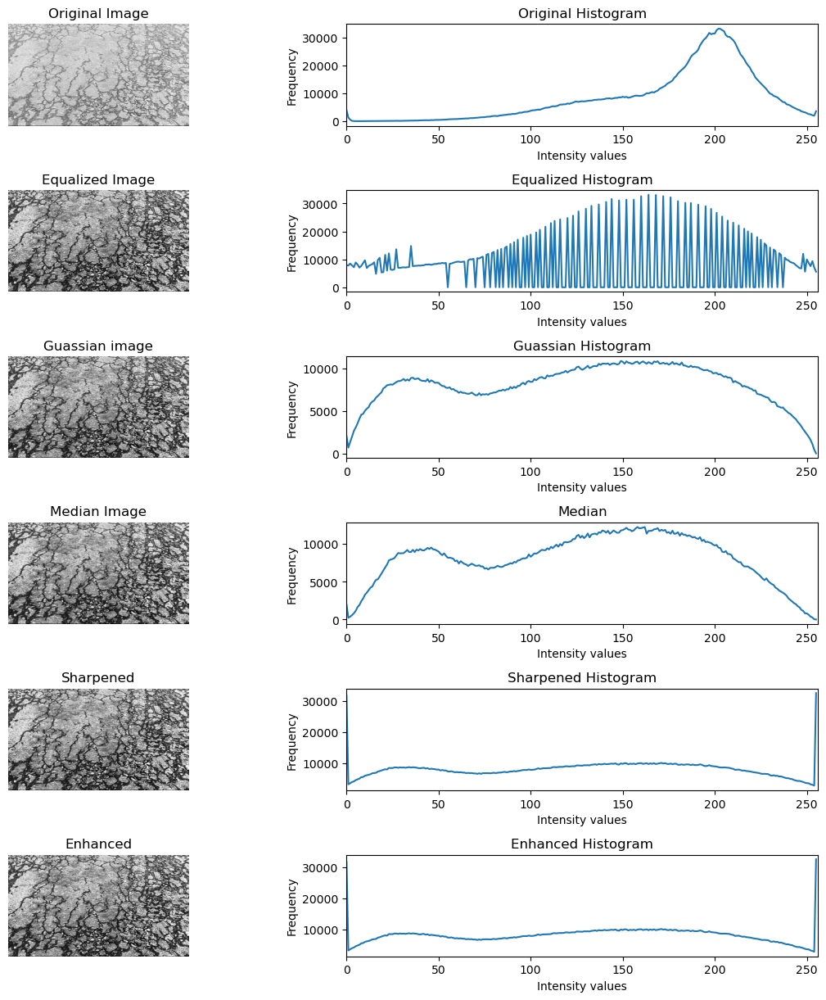

...

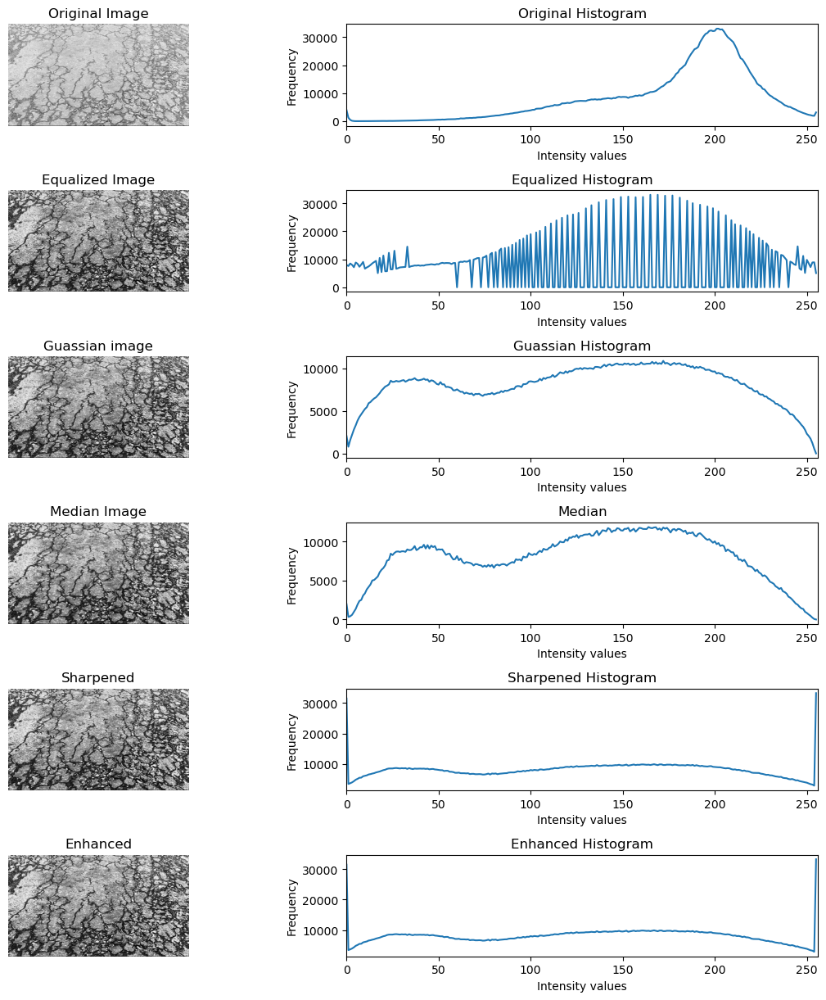

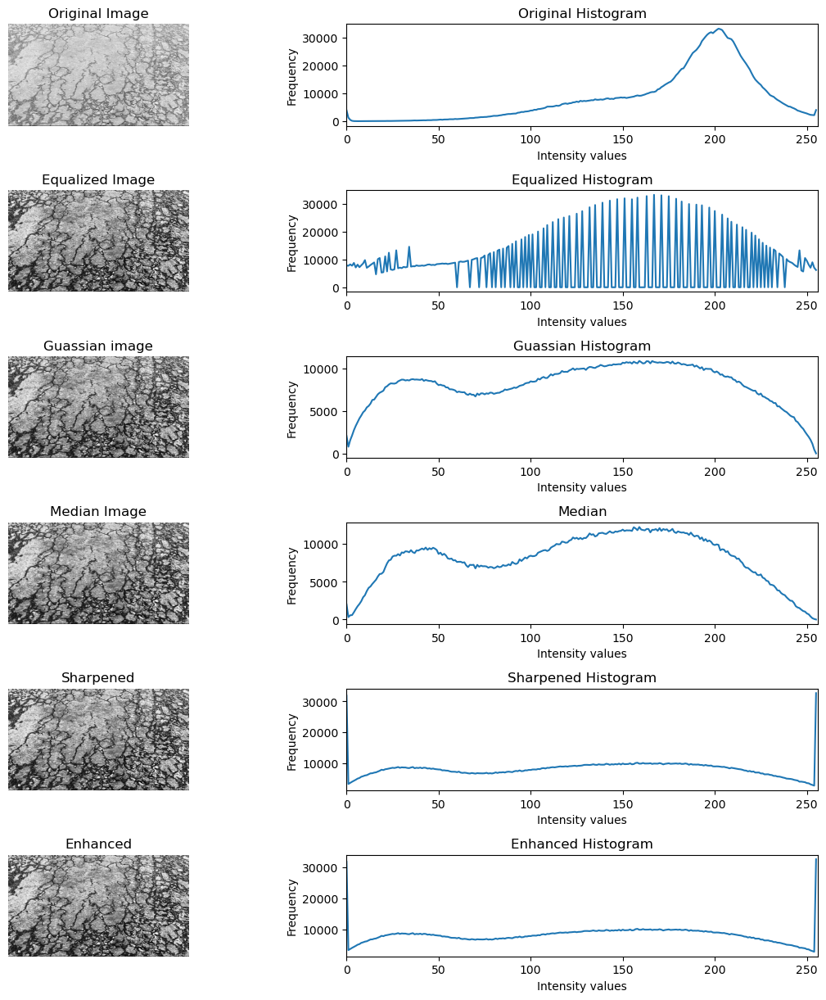

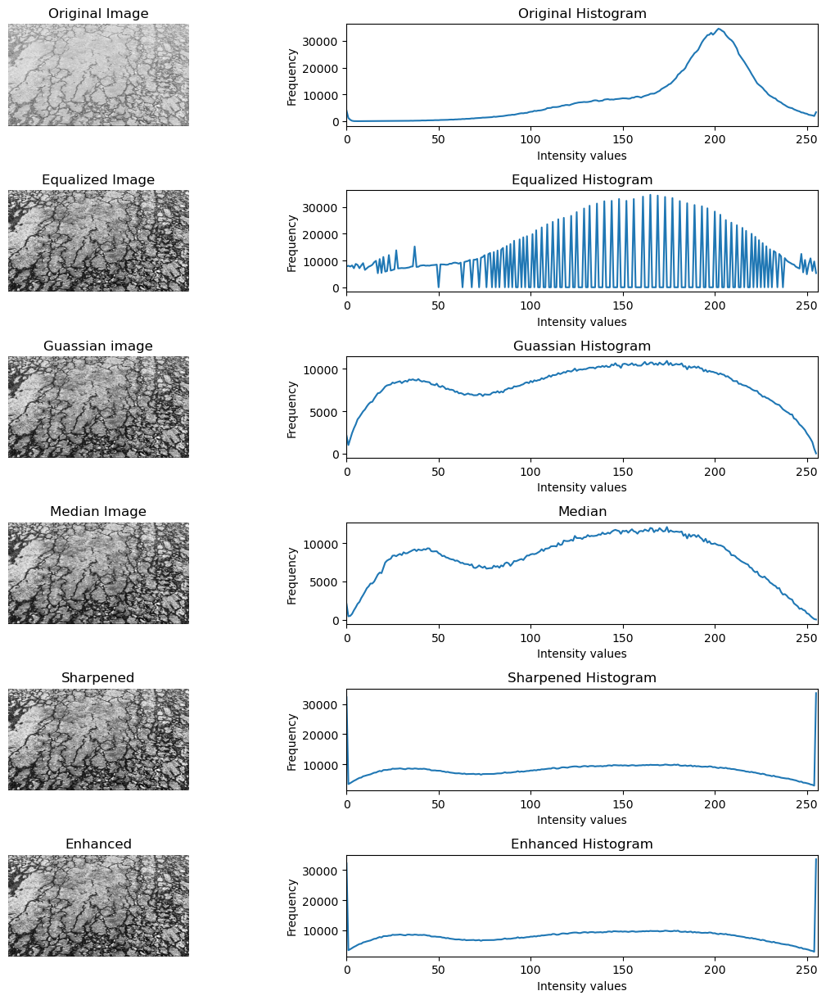

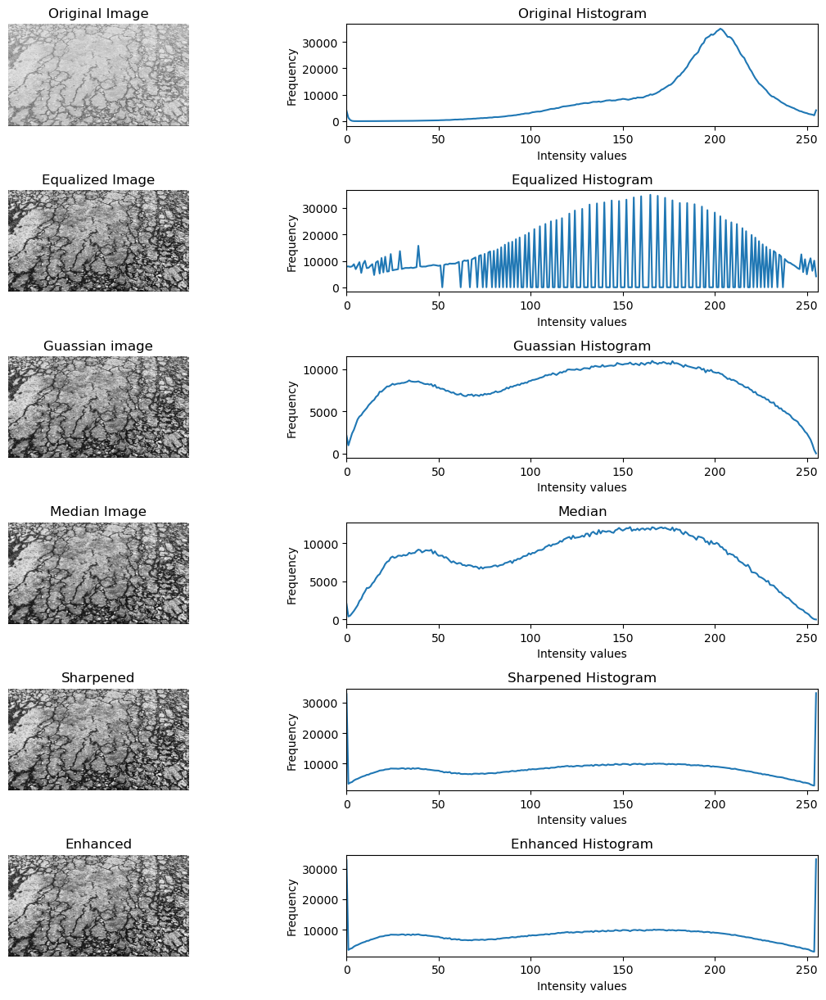

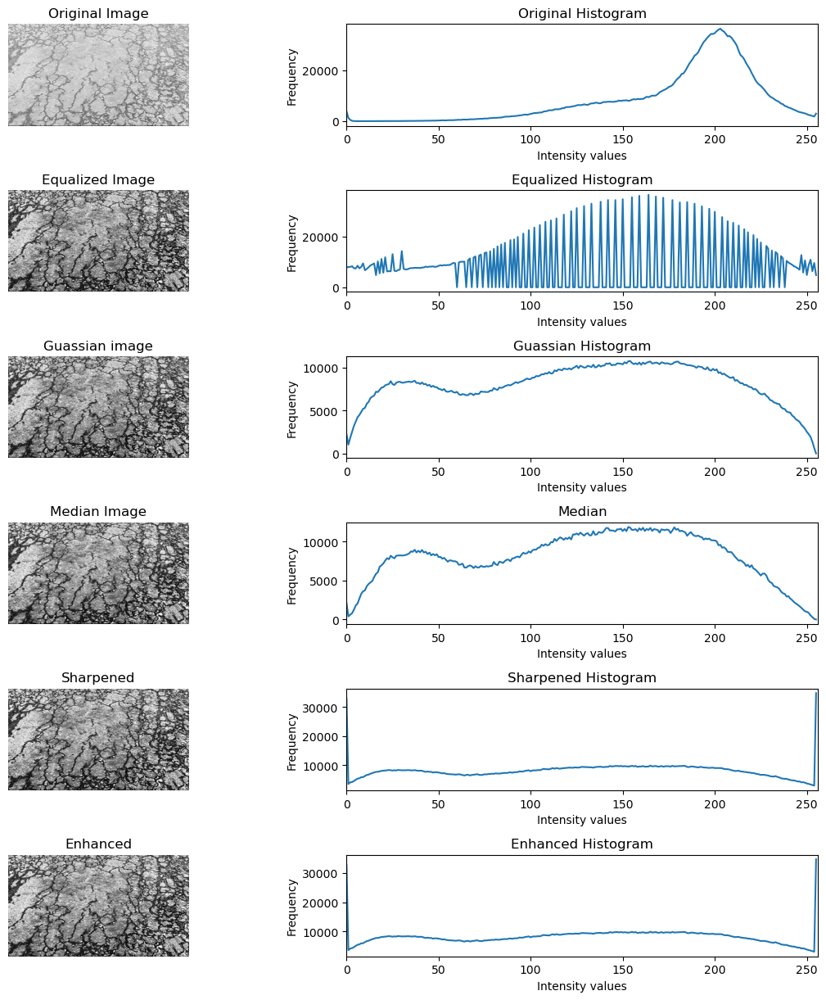

KeyboardInterrupt: 

In [6]:
import numpy as np
import matplotlib.pyplot as plt

def histogram(image,title):
    histogram = cv2.calcHist([image],[0],None,[256],[0,256])

    plt.title(title)
    plt.xlabel("Intensity values")
    plt.ylabel("Frequency")
    plt.plot(histogram)
    plt.xlim([0,256])



# SAVE FILES INTO THE FOLDER PATH

# Input path
input_folder = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Frames"

# Eqaulized output folder path
equalized_output = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Equalized_Frames"

# equalized_guassian folder path
equalized_guassian = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Equalized_Guassian_Frames"

# Equalized_Guassian_Median folder path
equalized_guassian_median = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Equalized_Guassianed_Median_Frames"

# Equalized_Guassianed_Median_Sharpened folder path
equalized_guassian_median_sharpend = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Equalized_Guassianed_Median_Sharpened_Frames"

#Final_Enhanced_Frames
Final_Enhanced_Frames = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Final_Enhanced_Frames"

# Final folder path
output_folder = r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\output_folder"

# Create output folder if it doesn't exist
os.makedirs(equalized_output, exist_ok=True)
os.makedirs(equalized_guassian, exist_ok=True)
os.makedirs(equalized_guassian_median, exist_ok=True)
os.makedirs(equalized_guassian_median_sharpend, exist_ok=True)
os.makedirs(Final_Enhanced_Frames, exist_ok=True)
os.makedirs(output_folder, exist_ok=True)

#image_extensions = ('.png', '.jpg', '.jpeg', '.tif', '.bmp')


# Loop through all images
for filename in os.listdir(input_folder):

    #if filename.lower().endswith(image_extensions):

        input_path = os.path.join(input_folder, filename)
        img = cv2.imread(input_path, 0)

        if img is None:
            continue


    # Equalization Apply
        equalized = cv2.equalizeHist(img)

    # Noice Remoeval
        # Guassian Apply
        guassian = cv2.GaussianBlur(equalized,(5,5),1.0)
        # Median Apply
        median = cv2.medianBlur(guassian,(5))

    # Calculate Sharpness
        laplacian = cv2.Laplacian(median, cv2.CV_64F)
        sharpness = laplacian.var()

    # Apply sharpening
        sharpened = median - laplacian
        sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
        enhanced = sharpened


    
        plt.figure(figsize =(12,20))

    
    # Display Original Image 
        plt.subplot(10, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')
    # Display Original Image Histogram
        plt.subplot(10,2,2)
        histogram(img,"Original Histogram")

    
    # Display Equalized Image
        plt.subplot(10, 2, 3)
        plt.imshow(equalized, cmap='gray')
        plt.title("Equalized Image")
        plt.axis('off')
    # Display Equalized Image Histogram
        plt.subplot(10, 2, 4)
        histogram(equalized, "Equalized Histogram")

    
    # Display Equalized_Guassian Image
        plt.subplot(10,2,5)
        plt.imshow(guassian, cmap='gray')
        plt.title("Guassian image")
        plt.axis('off')
    # Display Equalized_Guassian Image Histogram
        plt.subplot(10,2,6)
        histogram(guassian,"Guassian Histogram")

    
    # Display Equalized_Guassianed_Median Image
        plt.subplot(10,2,7)
        plt.imshow(median, cmap='gray')
        plt.title("Median Image")
        plt.axis('off')
    # Display Equalized_Guassianed_Median Image Histogram
        plt.subplot(10,2,8)
        histogram(median,"Median")

    
    # Display Equalized_Guassianed_Median_Sharpened Image
        plt.subplot(10,2,9)
        plt.imshow(sharpened, cmap='gray')
        plt.title("Sharpened")
        plt.axis("off")
    # Display Equalized_Guassianed_Median_Sharpened Image Histogram
        plt.subplot(10,2,10)
        histogram(sharpened,"Sharpened Histogram")

    # Display Equalized_Guassianed_Median_Sharpened Image
        plt.subplot(10,2,11)
        plt.imshow(enhanced, cmap='gray')
        plt.title("Enhanced")
        plt.axis("off")
    # Display Equalized_Guassianed_Median_Sharpened Image Histogram
        plt.subplot(10,2,12)
        histogram(enhanced,"Enhanced Histogram")

    
        plt.tight_layout()
        plt.show()


        # SAVE FILES INTO THE FOLDER PATH
        
        # Eqaulized output folder path
        cv2.imwrite(os.path.join(equalized_output, f"{os.path.splitext(filename)[0]}_equalized.png"), equalized)

        # equalized_guassian folder path
        cv2.imwrite(os.path.join(equalized_guassian, f"{os.path.splitext(filename)[0]}_guassian.png"), guassian)

        # Equalized_Guassian_Median folder path
        cv2.imwrite(os.path.join(equalized_guassian_median, f"{os.path.splitext(filename)[0]}_median.png"), median)

        # Equalized_Guassianed_Median_Sharpened folder path
        cv2.imwrite(os.path.join(equalized_guassian_median_sharpend, f"{os.path.splitext(filename)[0]}_sharpened.png"), sharpened)

        # Final Enhanced folder path
        cv2.imwrite(os.path.join(Final_Enhanced_Frames, f"{os.path.splitext(filename)[0]}_enhanced.png"), enhanced)

        #Final output folder path
        cv2.imwrite(os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_enhanced.png"), enhanced)
        
print("Output Display Completed.")

## Convert enhanced frames to video

In [7]:
saved_frames = sorted([f for f in os.listdir(output_folder)])
sample = cv2.imread(os.path.join(output_folder, saved_frames[0]))
h, w = sample.shape[:2]

fps = len(saved_frames) / 8  # auto calculate FPS based on 8s video

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_out = cv2.VideoWriter("aligator_enhanced_output.mp4", fourcc, fps, (w, h))
for fname in saved_frames:
    frame = cv2.imread(os.path.join(output_folder, fname))
    video_out.write(frame)
video_out.release()

print("Video saved → aligator_enhanced_output.mp4")

# Play video
cap = cv2.VideoCapture("aligator_enhanced_output.mp4")
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    cv2.imshow("aligator_enhanced_output.mp4", frame)
    if cv2.waitKey(int(1000 / fps)) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

Video saved → aligator_enhanced_output.mp4


## Segmentation 

Starting Detection: alligator...


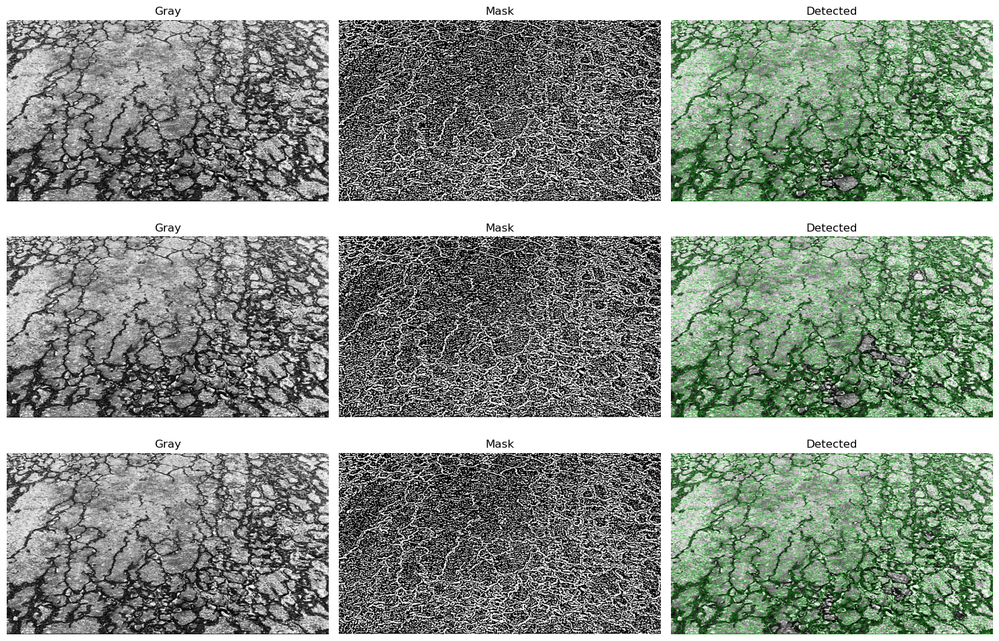

Done! Processed 12 frames. Video: alligator_detection_results.mp4


In [8]:
# --- 1. CONFIGURATION ---
# Set the mode to: "pothole", "alligator", "raveling", or "edge"
MODE = "alligator" 

# File Paths
paths = {
    "pothole": r"pothole_enhanced_output.mp4",
    "alligator": r"aligator_enhanced_output.mp4",
    "raveling": r"raveling_enhanced_output.mp4",
    "edge": r"edge_enhanced_output.mp4"
}

input_video = paths.get(MODE)
output_video = f"{MODE}_detection_results.mp4"

# --- 2. DETECTION ENGINE ---
def apply_detection(img, original, mode):
    mask = None
    label = ""
    color = (0, 0, 255) # Default Red

    if mode == "pothole":
        _, thresh = cv2.threshold(img, 60, 255, cv2.THRESH_BINARY_INV)
        k_s, k_l = np.ones((3,3)), cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, k_s, iterations=2)
        closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, k_l, iterations=2)
        mask = cv2.erode(cv2.dilate(closing, k_l, iterations=1), k_s, iterations=1)
        label = "Pothole"

    elif mode == "alligator":
        thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 5)
        clean = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((3,3)))
        mask = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, np.ones((3,3)))
        label = "Alligator Crack"
        color = (0, 255, 0) # Green

    elif mode == "raveling":
        _, thresh = cv2.threshold(img, 60, 255, cv2.THRESH_BINARY_INV)
        k_s, k_l = np.ones((3,3)), cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, k_s, iterations=2)
        mask = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, k_l, iterations=2)
        label = "RAVELING"

    elif mode == "edge":
        _, thresh = cv2.threshold(img, 60, 255, cv2.THRESH_BINARY_INV)
        k_s, k_l = np.ones((3,3)), cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, k_s, iterations=2)
        closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, k_l, iterations=2)
        mask = cv2.erode(cv2.dilate(closing, k_l, iterations=1), k_s, iterations=1)
       

    # Find and Draw Contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        area = cv2.contourArea(cnt)
        # Area filters based on mode
        min_area = 5000 if mode in ["pothole", "raveling"] else 50
        if area > min_area:
            if mode == "alligator":
                cv2.drawContours(original, [cnt], -1, color, 1)
            else:
                x, y, w_box, h_box = cv2.boundingRect(cnt)
                cv2.rectangle(original, (x, y), (x+w_box, y+h_box), color, 2)
                cv2.putText(original, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return mask, original

# --- 3. MAIN PROCESSING LOOP ---
cap = cv2.VideoCapture(input_video)
fps = cap.get(cv2.CAP_PROP_FPS)
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

output_frames, plot_grays, plot_masks, plot_detected = [], [], [], []
frame_id = 0

print(f"Starting Detection: {MODE}...")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret: break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    display_frame = frame.copy()

    # Apply specific detection
    refined_mask, result_frame = apply_detection(gray, display_frame, MODE)

    # Store for Plotting
    if frame_id < 3:
        plot_grays.append(gray.copy())
        plot_masks.append(refined_mask.copy())
        plot_detected.append(cv2.cvtColor(result_frame, cv2.COLOR_BGR2RGB))

    output_frames.append(result_frame)
    frame_id += 1

cap.release()

# --- 4. PLOTTING & VIDEO SAVE ---
# Save Video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_out = cv2.VideoWriter(output_video, fourcc, fps, (w, h))
for f in output_frames: video_out.write(f)
video_out.release()

# Show Summary Plot
plt.figure(figsize=(15, 10))
for i in range(len(plot_grays)):
    plt.subplot(3, 3, i*3+1); plt.imshow(plot_grays[i], cmap='gray'); plt.title("Gray"); plt.axis('off')
    plt.subplot(3, 3, i*3+2); plt.imshow(plot_masks[i], cmap='gray'); plt.title("Mask"); plt.axis('off')
    plt.subplot(3, 3, i*3+3); plt.imshow(plot_detected[i]); plt.title("Detected"); plt.axis('off')
plt.tight_layout()
plt.savefig(f"{MODE}_analysis_plot.png")
plt.show()

print(f"Done! Processed {frame_id} frames. Video: {output_video}")

## Play frames as Video

In [10]:
import cv2

# 1. DEFINE SETTINGS FIRST
new_width = 800
new_height = 600

# List of your video paths
# Note the 'r' before the path to handle backslashes correctly
videos = [
    (r"C:\Users\Dulhan Hansaja\Desktop\ICT2403_New\Project_videos\Alligator_tracking\IMG_6025.MOV", "Original Video"),
    ("aligator_enhanced_output.mp4", "Enhanced Video"),
    ("alligator_detection_results.mp4", "Detection Result")
]

# 2. LOOP THROUGH EACH VIDEO
for video_path, window_name in videos:
    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        print(f"Error: Could not open {video_path}")
        continue

    # Get FPS dynamically for each video
    fps = cap.get(cv2.CAP_PROP_FPS)
    if fps == 0: fps = 30  # Fallback if FPS detection fails

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Resize the frame
        resized_frame = cv2.resize(frame, (new_width, new_height))

        # Show the video
        cv2.imshow(window_name, resized_frame)
        
        # Press 'q' to skip to the next video
        if cv2.waitKey(int(1000 / fps)) & 0xFF == ord('q'):
            break

    cap.release()
    cv2.destroyWindow(window_name) # Closes current window before next video starts

cv2.destroyAllWindows()
print("All videos processed.")

All videos processed.
